**Chapter 6 – Decision Trees**

Decision trees is a flexible and powerful model that can be use for regression, classification and multioutput tasks. Unlike SVM they scale much better with large data. Regression trees are the building blocks of Random Forest, which is probably the most powerful algorithm for relatively clean data. We will cover Trees, CART algorithm used to estimate them and limitation of trees. 

# Setup

First, let's make sure this notebook works well in both python 2 and 3, import a few common modules, ensure MatplotLib plots figures inline and prepare a function to save the figures:

In [1]:
# To support both python 2 and python 3
from __future__ import division, print_function, unicode_literals

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "decision_trees"

def image_path(fig_id):
    return os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID, fig_id)

def save_fig(fig_id, tight_layout=True):
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(image_path(fig_id) + ".png", format='png', dpi=300)

# Training and visualizing

In [ ]:
# Install packages to grahp the tree
import sys
!conda install --yes --prefix {sys.prefix} pydotplus

Download and install Graphitz from:
https://graphviz.gitlab.io/_pages/Download/Download_windows.html

In [2]:
#Set the file path
import os     
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'

In [14]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier

iris = load_iris()
X = iris.data[:, 2:] # petal length and width
y = iris.target

tree_clf = DecisionTreeClassifier(max_depth=2, random_state=42)
tree_clf.fit(X, y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=2,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=42,
            splitter='best')

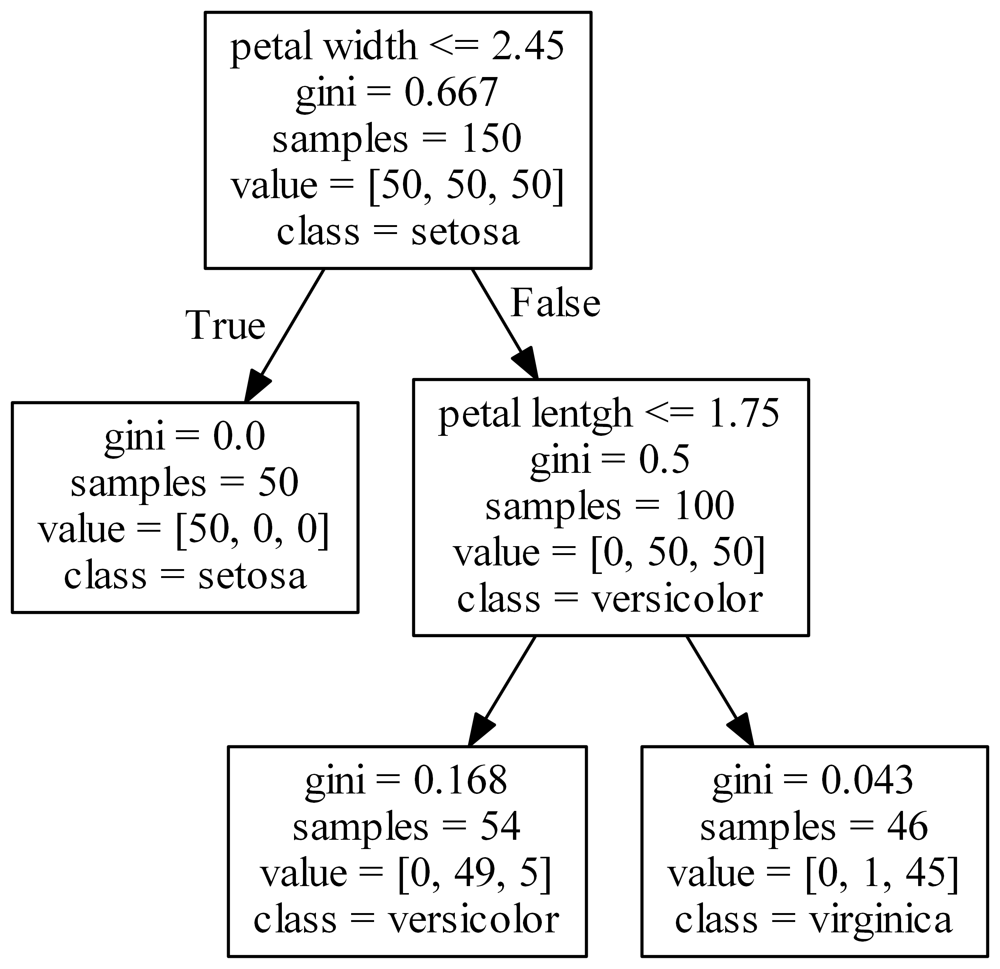

In [15]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import pydotplus
dot_data = tree.export_graphviz(tree_clf, out_file='tree.dot', 
                                feature_names=["petal width", "petal lentgh"],  
                                class_names=iris.target_names)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

Gini Impurity: <br>
$$G_i = 1 - \sum_{k=1}^n p_{i,k}^2$$
$p_{i,k}$ is the ratio of class $k$ instances among the training instances in the $i^{th}$ node. <br>
For the second leaf (green): $G_i = 1 - (0/54)^2 - (49/54)^2 - (5/54)^2 \approx 0.168$


Below is the classification with a tree of depth 3. Trees are white-box models: it is easy to figure out why a point received a particular classification. It is opposite with black-box model, such as neural networks, where predictions are hard to explain. 

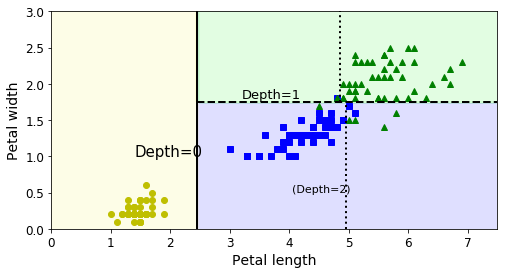

In [4]:
from matplotlib.colors import ListedColormap

def plot_decision_boundary(clf, X, y, axes=[0, 7.5, 0, 3], iris=True, legend=False, plot_training=True):
    x1s = np.linspace(axes[0], axes[1], 100)
    x2s = np.linspace(axes[2], axes[3], 100)
    x1, x2 = np.meshgrid(x1s, x2s)
    X_new = np.c_[x1.ravel(), x2.ravel()]
    y_pred = clf.predict(X_new).reshape(x1.shape)
    custom_cmap = ListedColormap(['#fafab0','#9898ff','#a0faa0'])
    plt.contourf(x1, x2, y_pred, alpha=0.3, cmap=custom_cmap)
    if not iris:
        custom_cmap2 = ListedColormap(['#7d7d58','#4c4c7f','#507d50'])
        plt.contour(x1, x2, y_pred, cmap=custom_cmap2, alpha=0.8)
    if plot_training:
        plt.plot(X[:, 0][y==0], X[:, 1][y==0], "yo", label="Iris-Setosa")
        plt.plot(X[:, 0][y==1], X[:, 1][y==1], "bs", label="Iris-Versicolor")
        plt.plot(X[:, 0][y==2], X[:, 1][y==2], "g^", label="Iris-Virginica")
        plt.axis(axes)
    if iris:
        plt.xlabel("Petal length", fontsize=14)
        plt.ylabel("Petal width", fontsize=14)
    else:
        plt.xlabel(r"$x_1$", fontsize=18)
        plt.ylabel(r"$x_2$", fontsize=18, rotation=0)
    if legend:
        plt.legend(loc="lower right", fontsize=14)

plt.figure(figsize=(8, 4))
plot_decision_boundary(tree_clf, X, y)
plt.plot([2.45, 2.45], [0, 3], "k-", linewidth=2)
plt.plot([2.45, 7.5], [1.75, 1.75], "k--", linewidth=2)
plt.plot([4.95, 4.95], [0, 1.75], "k:", linewidth=2)
plt.plot([4.85, 4.85], [1.75, 3], "k:", linewidth=2)
plt.text(1.40, 1.0, "Depth=0", fontsize=15)
plt.text(3.2, 1.80, "Depth=1", fontsize=13)
plt.text(4.05, 0.5, "(Depth=2)", fontsize=11)
plt.show()

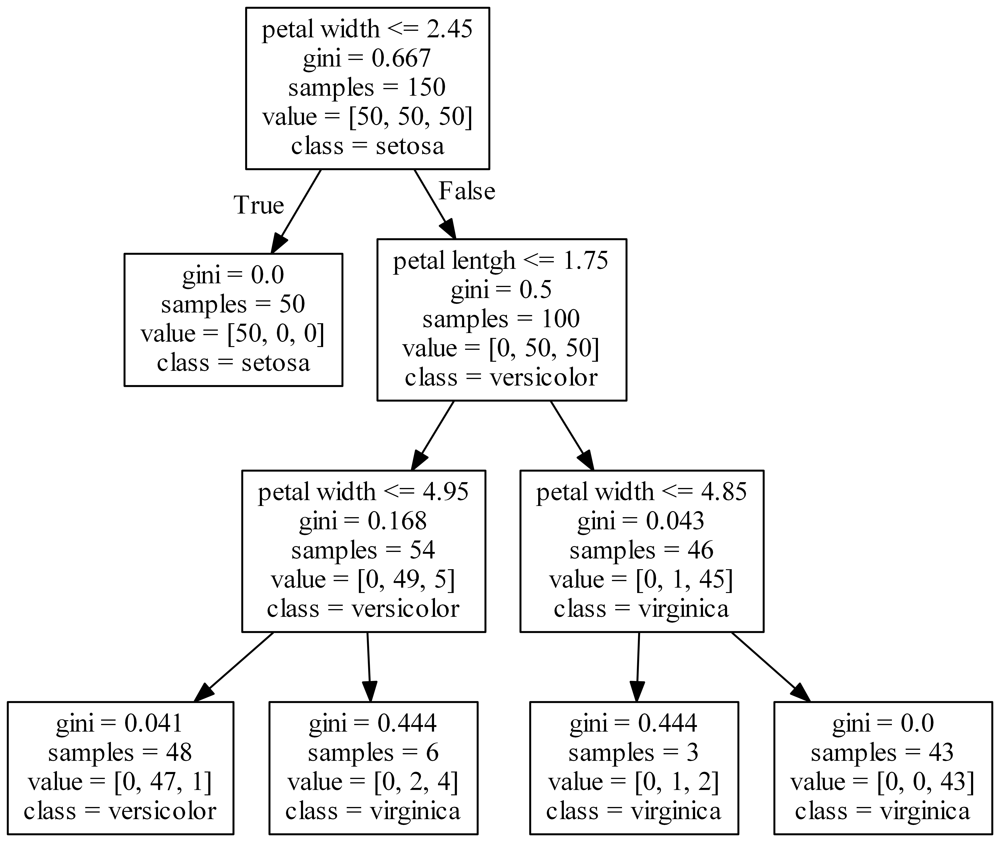

In [16]:
tree_clf3 = DecisionTreeClassifier(max_depth=3, random_state=42)
tree_clf3.fit(X, y)
dot_data = tree.export_graphviz(tree_clf3, out_file='tree.dot', 
                                feature_names=["petal width", "petal lentgh"],  
                                class_names=iris.target_names)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

# Predicting classes and class probabilities

Trees models predict probabilities like any other classification models. A flower with petal length = 5 cm and width = 1.5 cm is predicted to be Iris-Versicolor (class = 1) with a probability 90.7%. 

In [5]:
tree_clf.predict_proba([[5, 1.5]])

array([[0.        , 0.90740741, 0.09259259]])

In [6]:
# This prediction is correct. 
tree_clf.predict([[5, 1.5]])

array([1])

# Cart Training Algorithm

When tree grows the algorithm is looking for an optimal feature ($k$) to split on the optimal threshold ($t_k$).  It searches fop optimal $k$ and $t_k$ by minimizing the cost function:
$$J(k, t_k ) = \frac{m_{left}}{m}G_{left} + \frac{m_{right}}{m}G_{right}$$
where $G$ is measure of impurity of left/right subset, and $m$ is the number of instances. Basically, this is a weighted average of impurities of two leafs. <br>
The splitting continues until further split cannot reduce impurity or it is stopped by hyperparameters, such as reaching specified maximum tree depth. Additional condition (min_samples_split, min_sam
ples_leaf, min_weight_fraction_leaf, and max_leaf_nodes). <br>
CART is the greedy algorithm is optimized the split decision only at the current level even if it does not lead the optimal splitting on the lower levels. It is good, but not optimal. <br>
Finding optimal solution to a tree problem is a NP-Complete problem that requires $O(e^{m})$ time, which is intractable even for a small datasets. <br>
Through estimating trees may take time, it is very quickly to make predictions using already estimated trees. If the tree is approximately balanced (branches had similar depth) the tree can be traversed going through $O(log_{2}(m))$ nodes and each node requires to check just one feature. On the other hand training the tree has the complexity $O(n \times m log(m))$. If multiple trees will be estimated from a dataset, it can be done faster by sorting the data (set presort=True). However for large training sets sorting is actually slows the training. 

# Entropy 

Another measure of impurity is entropy used in physics and information theory. Entropy is zero is all instances have the same class:
$$H_i = - \sum^n_{\substack{{k=1} \\ {p_{i,k} \neq 0}}} p_{i,k} \log (p_{i,k})$$
Then depth-2 node on the figure is: $-\frac{49}{54}\log\big(\frac{49}{54}\big) -\frac{5}{54}\log\big(\frac{5}{54}\big) \approx 0.31$ <br>
Most of the time entropy and Gini produce similar results. Gini is slightly faster to estimate, but it tends to isolate largest  class in one leaf, while entropy produces most balanced trees. 

# Regularization
Trees does not estimate specific predetermined parameters, it adds parameters as needed. If left unconstrained it will just classify all data points reducing training error to zero, so it has a risk of over-fitting. This risk is reduced by regularization parameters, which restrict the growth of the tree. <br>
_max_depth_ restricts the maximum depth of the tree <br>
_min_samples_split_ restricts the smallest number of instances in a branch that can be split, otherwise we could just product a leaf for each observation if necessary. <br>
_min_samples_leaf_ Similarly, restricts the number of instances in a leaf. <br>
_min_weight_fraction_leaf_ instead of restricting the number of instances, restrict the fraction of sample that can be in each leaf.  <br>
_max_leaf_nodes_ Restricts maximum number of leafs in the model. <br>
_max_features_ restricts the maximum number of features evaluated for splitting at each node.  <br>
Imposing these restrictions reduces the fit of the training dataset. <br> <br>

Other algorithms restricting the tree's growth are pruning - deleting unnecessary nodes if the purity improvement it provides is not statistically significant. The $\chi^2$-test with 5% p-value is typically used.



# Sensitivity to training set details

In [7]:
X[(X[:, 1]==X[:, 1][y==1].max()) & (y==1)] # widest Iris-Versicolor flower

array([[4.8, 1.8]])

In [17]:
not_widest_versicolor = (X[:, 1]!=1.8) | (y==2)
X_tweaked = X[not_widest_versicolor]
y_tweaked = y[not_widest_versicolor]

tree_clf_tweaked = DecisionTreeClassifier(max_depth=2, random_state=40)
tree_clf_tweaked.fit(X_tweaked, y_tweaked)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=2,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=40,
            splitter='best')

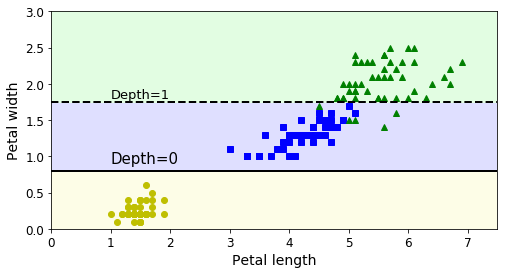

In [18]:
plt.figure(figsize=(8, 4))
plot_decision_boundary(tree_clf_tweaked, X_tweaked, y_tweaked, legend=False)
plt.plot([0, 7.5], [0.8, 0.8], "k-", linewidth=2)
plt.plot([0, 7.5], [1.75, 1.75], "k--", linewidth=2)
plt.text(1.0, 0.9, "Depth=0", fontsize=15)
plt.text(1.0, 1.80, "Depth=1", fontsize=13)
plt.show()

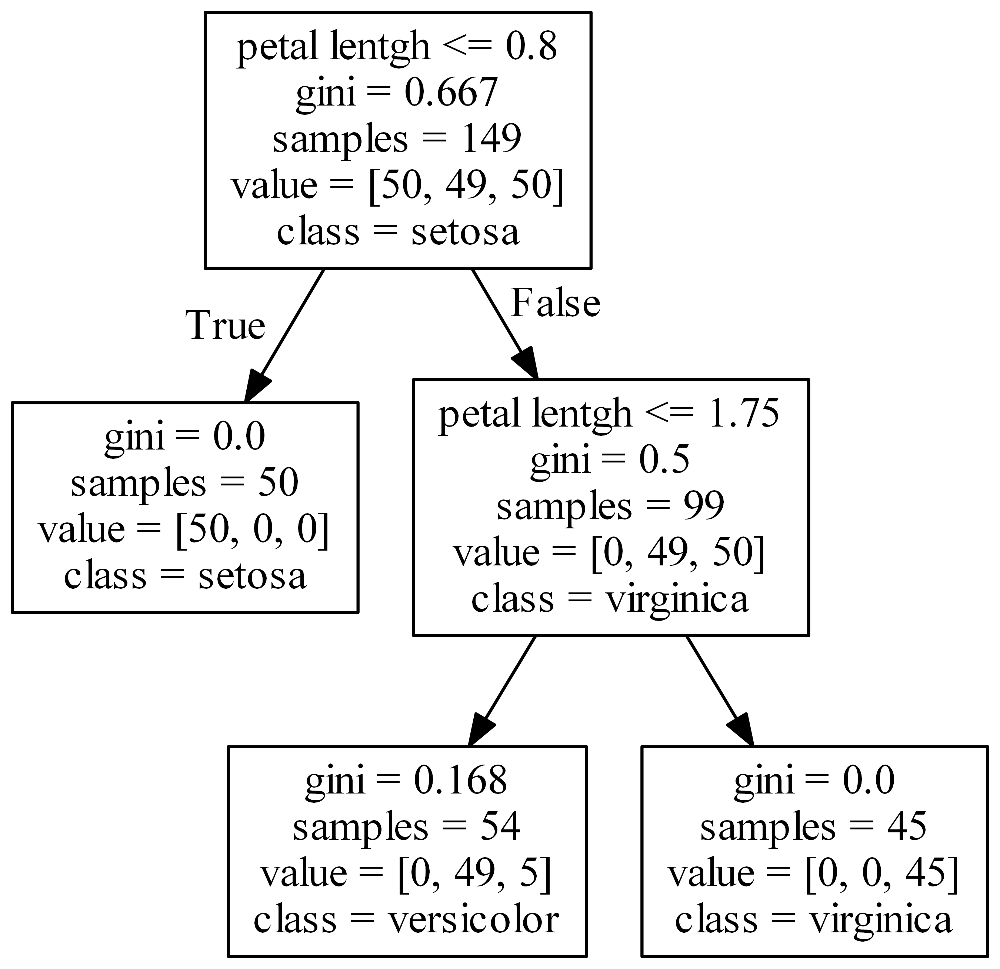

In [19]:
dot_data = tree.export_graphviz(tree_clf_tweaked, out_file='tree.dot', 
                                feature_names=["petal width", "petal lentgh"],  
                                class_names=iris.target_names)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

Let's train two trees on the samples of 100 moons. The left plot does not have any restrictions. The left plot restricts min_samples_leaf = 4 : there should be at least 4 observations in each leaf. The left model is likely to over-fit. 

Saving figure min_samples_leaf_plot


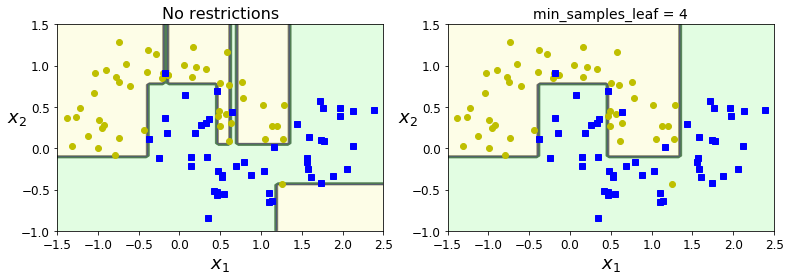

In [20]:
from sklearn.datasets import make_moons
Xm, ym = make_moons(n_samples=100, noise=0.25, random_state=53)
#Unrestricted tree
deep_tree_clf1 = DecisionTreeClassifier(random_state=42)
# Restricted tree with min_samples_leaf = 4
deep_tree_clf2 = DecisionTreeClassifier(min_samples_leaf=4, random_state=42)
deep_tree_clf1.fit(Xm, ym)
deep_tree_clf2.fit(Xm, ym)

plt.figure(figsize=(11, 4))
plt.subplot(121)
plot_decision_boundary(deep_tree_clf1, Xm, ym, axes=[-1.5, 2.5, -1, 1.5], iris=False)
plt.title("No restrictions", fontsize=16)
plt.subplot(122)
plot_decision_boundary(deep_tree_clf2, Xm, ym, axes=[-1.5, 2.5, -1, 1.5], iris=False)
plt.title("min_samples_leaf = {}".format(deep_tree_clf2.min_samples_leaf), fontsize=14)

save_fig("min_samples_leaf_plot")
plt.show()

In [22]:
dot_data = tree.export_graphviz(deep_tree_clf1, out_file='tree.dot', 
                                feature_names=["petal width", "petal lentgh"],  
                                class_names=iris.target_names)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

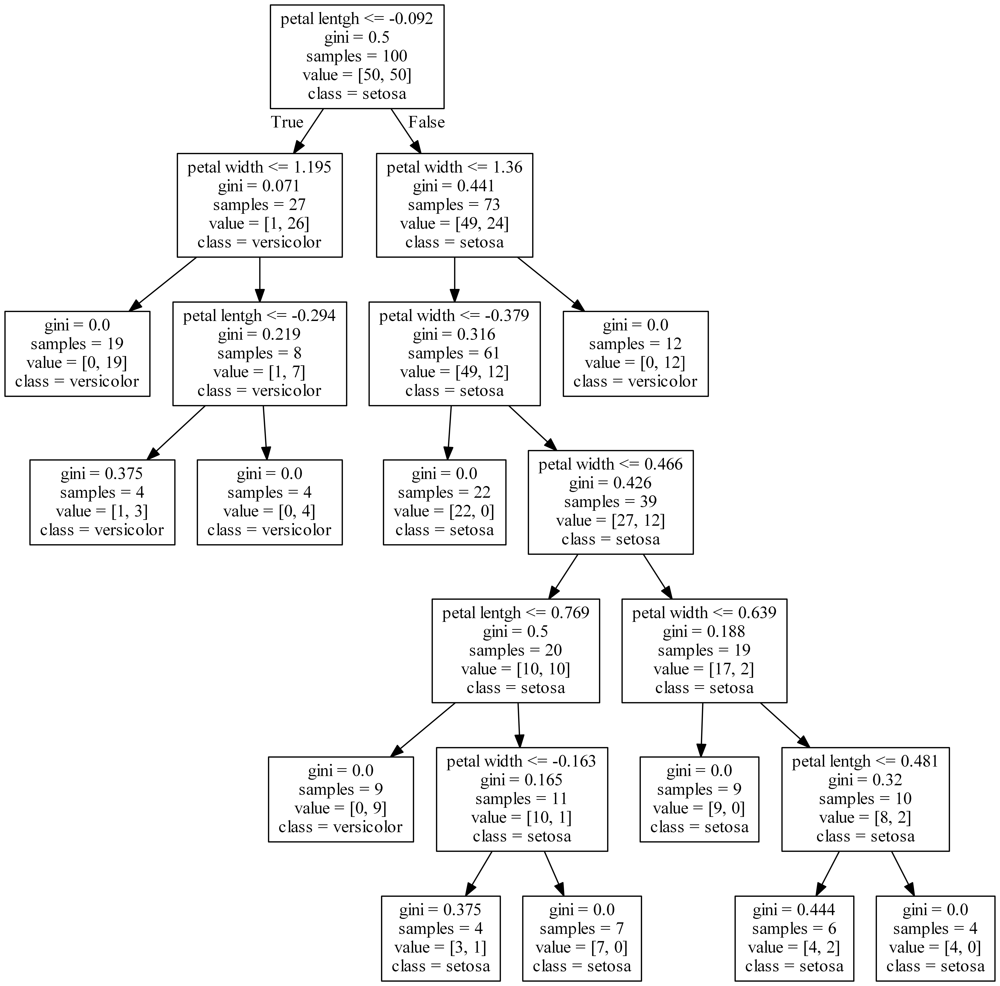

In [23]:
dot_data = tree.export_graphviz(deep_tree_clf2, out_file='tree.dot', 
                                feature_names=["petal width", "petal lentgh"],  
                                class_names=iris.target_names)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

Trees better classify data is the border lines are parallel to the features. Rotation of data toward the axes can improve fit. Rotation of data by 20 degrees clock-wise.

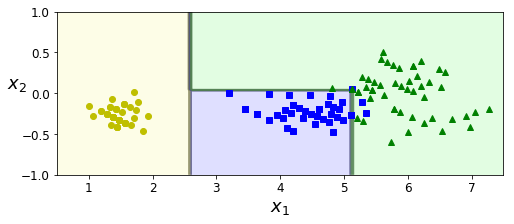

In [24]:
# Rotiation angle
angle = np.pi / 180 * 20
# Create rotaton matrix 2x2 for each point on a 2-dimensional plane
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])
# Multiply x-data by the rotation matrix to shift the points
Xr = X.dot(rotation_matrix)
# Estimate a new tree
tree_clf_r = DecisionTreeClassifier(random_state=42)
tree_clf_r.fit(Xr, y)

plt.figure(figsize=(8, 3))
# Tree with depth 3 is enough to classify data almost perfectly.
plot_decision_boundary(tree_clf_r, Xr, y, axes=[0.5, 7.5, -1.0, 1], iris=False)

plt.show()

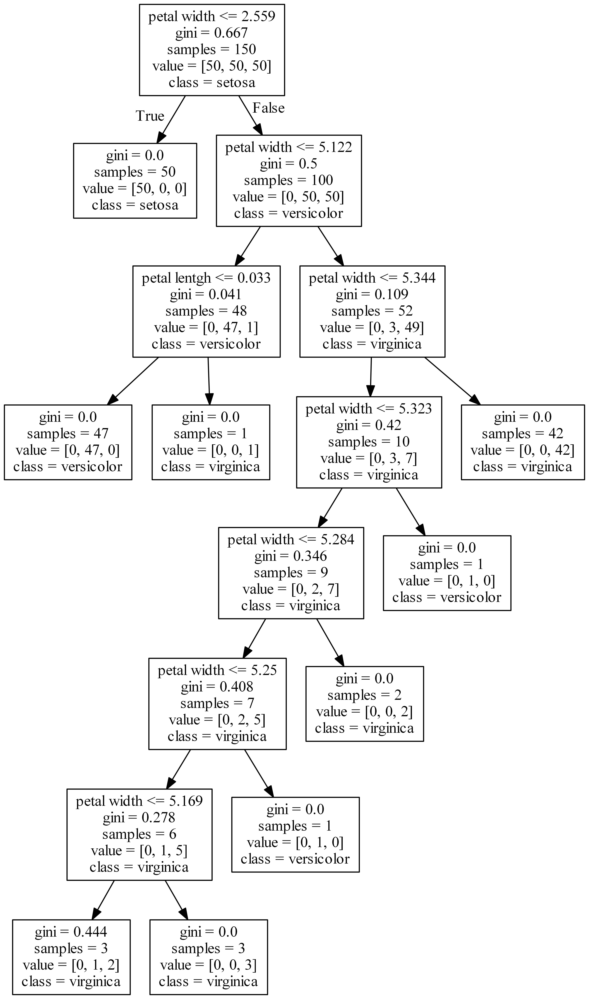

In [25]:
dot_data = tree.export_graphviz(tree_clf_r, out_file='tree.dot', 
                                feature_names=["petal width", "petal lentgh"],  
                                class_names=iris.target_names)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

Next we show the reverse. We start with simple data that can be easily classified linearly: <br>
$X1$ and $X2$ are random number between 0.5 and -0.5. $y=1$ if $X1 > 0$ and $y=0$ if $X1 < 0$.  <br>
The data can be classified with a tree of level 1 (2 leafs). <br>
However, if we rotate the data by 45 degrees it, the classification border is now diagonal to the both $X1$ and $X2$ and we need a more complicated tree with 5 splits to classify it with more likely of over-fitting.  

Saving figure sensitivity_to_rotation_plot


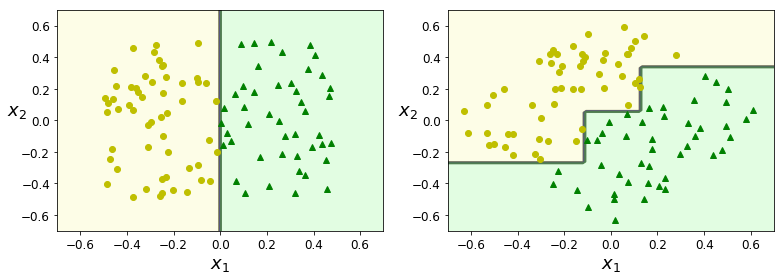

In [27]:
np.random.seed(6)
Xs = np.random.rand(100, 2) - 0.5
ys = (Xs[:, 0] > 0).astype(np.float32) * 2

angle = np.pi / 4
rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])
Xsr = Xs.dot(rotation_matrix)

tree_clf_s = DecisionTreeClassifier(random_state=42)
tree_clf_s.fit(Xs, ys)
tree_clf_sr = DecisionTreeClassifier(random_state=42)
tree_clf_sr.fit(Xsr, ys)

plt.figure(figsize=(11, 4))
plt.subplot(121)
plot_decision_boundary(tree_clf_s, Xs, ys, axes=[-0.7, 0.7, -0.7, 0.7], iris=False)
plt.subplot(122)
plot_decision_boundary(tree_clf_sr, Xsr, ys, axes=[-0.7, 0.7, -0.7, 0.7], iris=False)

save_fig("sensitivity_to_rotation_plot")
plt.show()

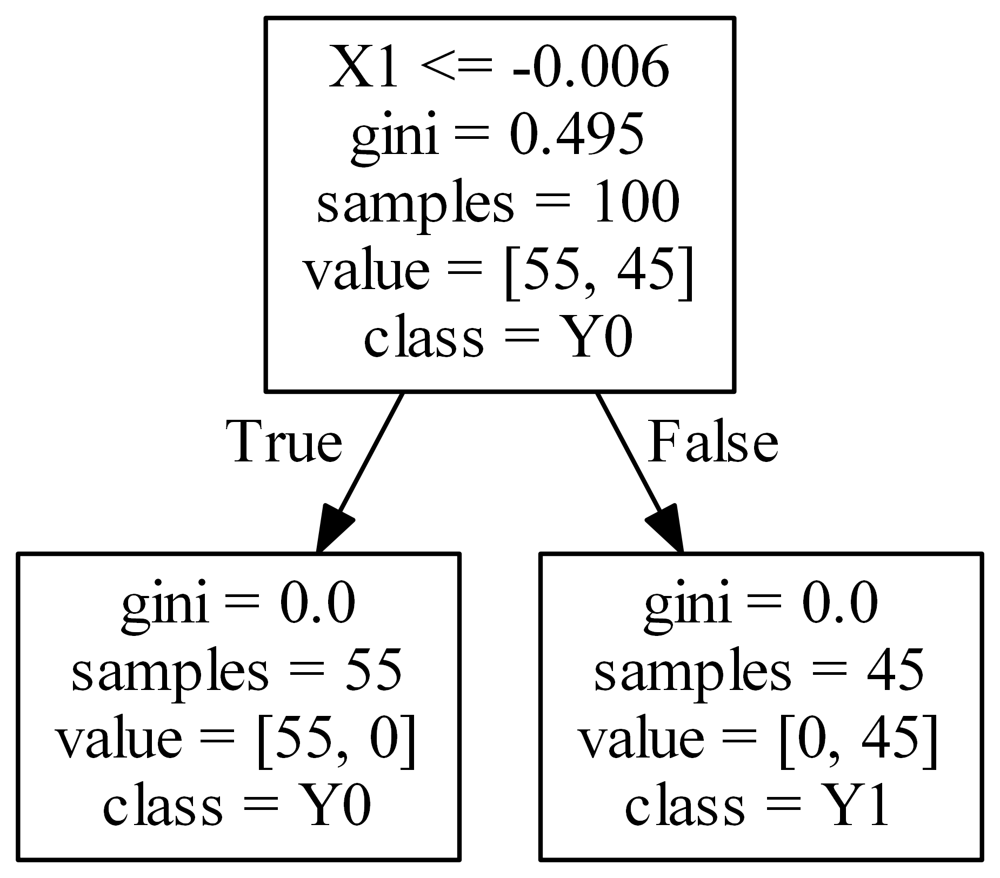

In [28]:
dot_data = tree.export_graphviz(tree_clf_s, out_file='tree.dot', 
                                feature_names=["X1", "X2"],  
                                class_names=["Y0", "Y1"])
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

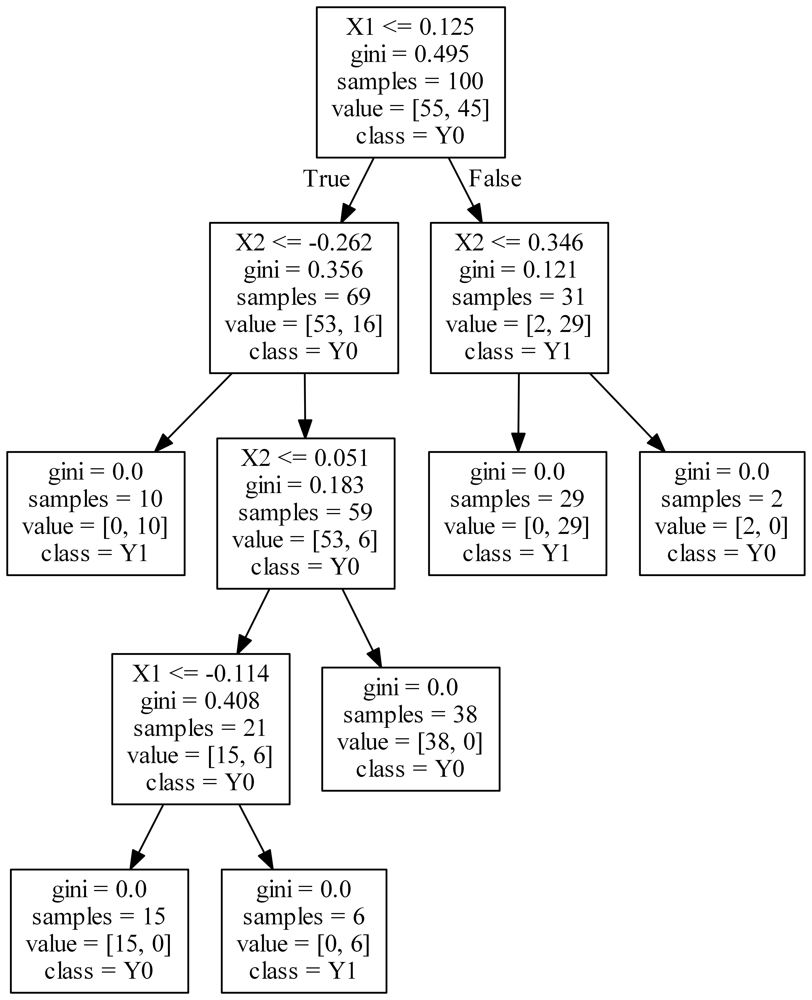

In [29]:
dot_data = tree.export_graphviz(tree_clf_sr, out_file='tree.dot', 
                                feature_names=["X1", "X2"],  
                                class_names=["Y0", "Y1"])
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

# Regression trees

Trees are used to estimate regression (predict continuous variables). Start with:
$X = u$, where $u \in (0,1)$, and $y = 4*(X - 0.5)^2 + 0.1 u$ 

In [30]:
# Quadratic training set + noise
np.random.seed(42)
m = 200
X = np.random.rand(m, 1)
y = 4 * (X - 0.5) ** 2
y = y + np.random.randn(m, 1) / 10

We start with a regression tree with the maximum depth of 2 (maximum 4 leafs and 3 splits).

In [31]:
# Import TreeRegression
from sklearn.tree import DecisionTreeRegressor
#Fit the regression
tree_reg = DecisionTreeRegressor(max_depth=2, random_state=42)
tree_reg.fit(X, y)

DecisionTreeRegressor(criterion='mse', max_depth=2, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=42, splitter='best')

Saving figure tree_regression_plot


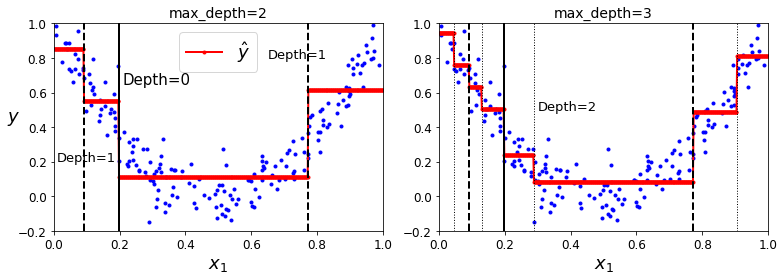

In [32]:
# Specify two models: simple with the maximum depth of 2 and complex with a maximum depth of 3. 
from sklearn.tree import DecisionTreeRegressor

tree_reg1 = DecisionTreeRegressor(random_state=42, max_depth=2)
tree_reg2 = DecisionTreeRegressor(random_state=42, max_depth=3)
tree_reg1.fit(X, y)
tree_reg2.fit(X, y)

def plot_regression_predictions(tree_reg, X, y, axes=[0, 1, -0.2, 1], ylabel="$y$"):
    x1 = np.linspace(axes[0], axes[1], 500).reshape(-1, 1)
    y_pred = tree_reg.predict(x1)
    plt.axis(axes)
    plt.xlabel("$x_1$", fontsize=18)
    if ylabel:
        plt.ylabel(ylabel, fontsize=18, rotation=0)
    plt.plot(X, y, "b.")
    plt.plot(x1, y_pred, "r.-", linewidth=2, label=r"$\hat{y}$")

plt.figure(figsize=(11, 4))
plt.subplot(121)
plot_regression_predictions(tree_reg1, X, y)
for split, style in ((0.1973, "k-"), (0.0917, "k--"), (0.7718, "k--")):
    plt.plot([split, split], [-0.2, 1], style, linewidth=2)
plt.text(0.21, 0.65, "Depth=0", fontsize=15)
plt.text(0.01, 0.2, "Depth=1", fontsize=13)
plt.text(0.65, 0.8, "Depth=1", fontsize=13)
plt.legend(loc="upper center", fontsize=18)
plt.title("max_depth=2", fontsize=14)

plt.subplot(122)
plot_regression_predictions(tree_reg2, X, y, ylabel=None)
for split, style in ((0.1973, "k-"), (0.0917, "k--"), (0.7718, "k--")):
    plt.plot([split, split], [-0.2, 1], style, linewidth=2)
for split in (0.0458, 0.1298, 0.2873, 0.9040):
    plt.plot([split, split], [-0.2, 1], "k:", linewidth=1)
plt.text(0.3, 0.5, "Depth=2", fontsize=13)
plt.title("max_depth=3", fontsize=14)

save_fig("tree_regression_plot")
plt.show()

Red solid lins are the predictions. We are not doing very well. 

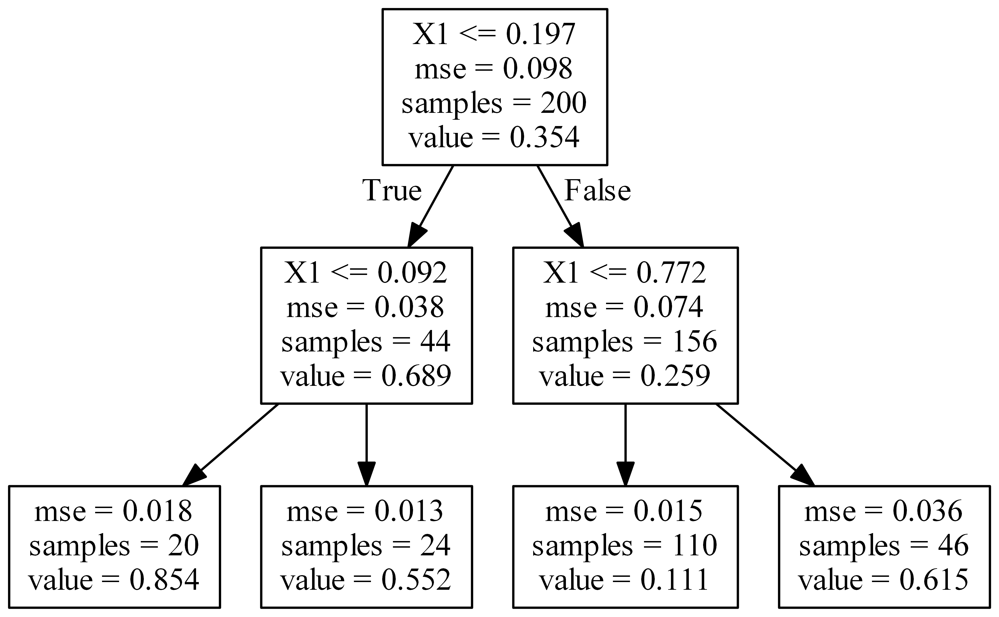

In [35]:
dot_data = tree.export_graphviz(tree_reg1, out_file='tree.dot', 
                                feature_names=["X1"],  
                                class_names=["Y0"])
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

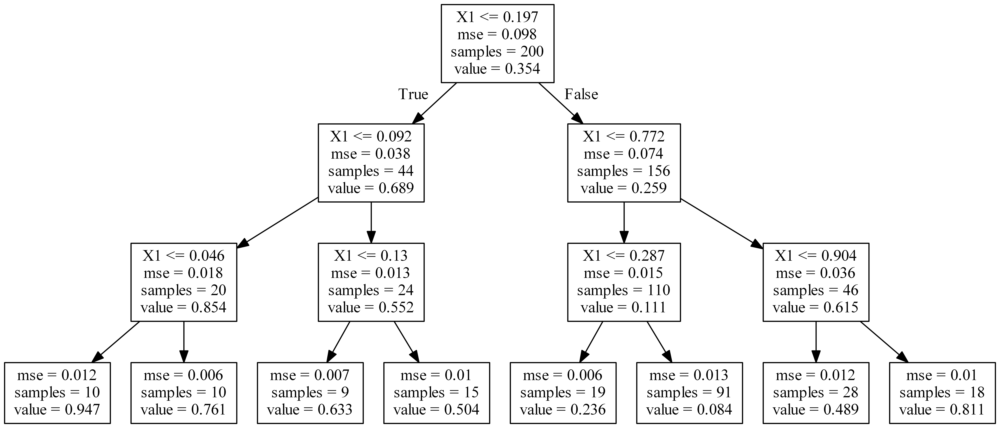

In [36]:
dot_data = tree.export_graphviz(tree_reg2, out_file='tree.dot', 
                                feature_names=["X1"],  
                                class_names=["Y0"])
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

Next we will try unrestricted tree and the tree with the smallest number of observations in a leaf equal to 10.

Saving figure tree_regression_regularization_plot


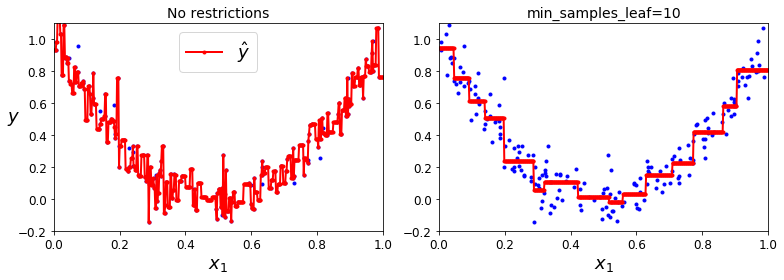

In [37]:
# Unrestricted tree
tree_reg1 = DecisionTreeRegressor(random_state=42)
# Tree restricted with the smallest number of observations per leaf = 10. 
tree_reg2 = DecisionTreeRegressor(random_state=42, min_samples_leaf=10)
tree_reg1.fit(X, y)
tree_reg2.fit(X, y)

x1 = np.linspace(0, 1, 500).reshape(-1, 1)
y_pred1 = tree_reg1.predict(x1)
y_pred2 = tree_reg2.predict(x1)

plt.figure(figsize=(11, 4))

plt.subplot(121)
plt.plot(X, y, "b.")
plt.plot(x1, y_pred1, "r.-", linewidth=2, label=r"$\hat{y}$")
plt.axis([0, 1, -0.2, 1.1])
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$y$", fontsize=18, rotation=0)
plt.legend(loc="upper center", fontsize=18)
plt.title("No restrictions", fontsize=14)

plt.subplot(122)
plt.plot(X, y, "b.")
plt.plot(x1, y_pred2, "r.-", linewidth=2, label=r"$\hat{y}$")
plt.axis([0, 1, -0.2, 1.1])
plt.xlabel("$x_1$", fontsize=18)
plt.title("min_samples_leaf={}".format(tree_reg2.min_samples_leaf), fontsize=14)

save_fig("tree_regression_regularization_plot")
plt.show()

In [38]:
dot_data = tree.export_graphviz(tree_reg1, out_file='tree.dot', 
                                feature_names=["X1"],  
                                class_names=["Y0"])
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

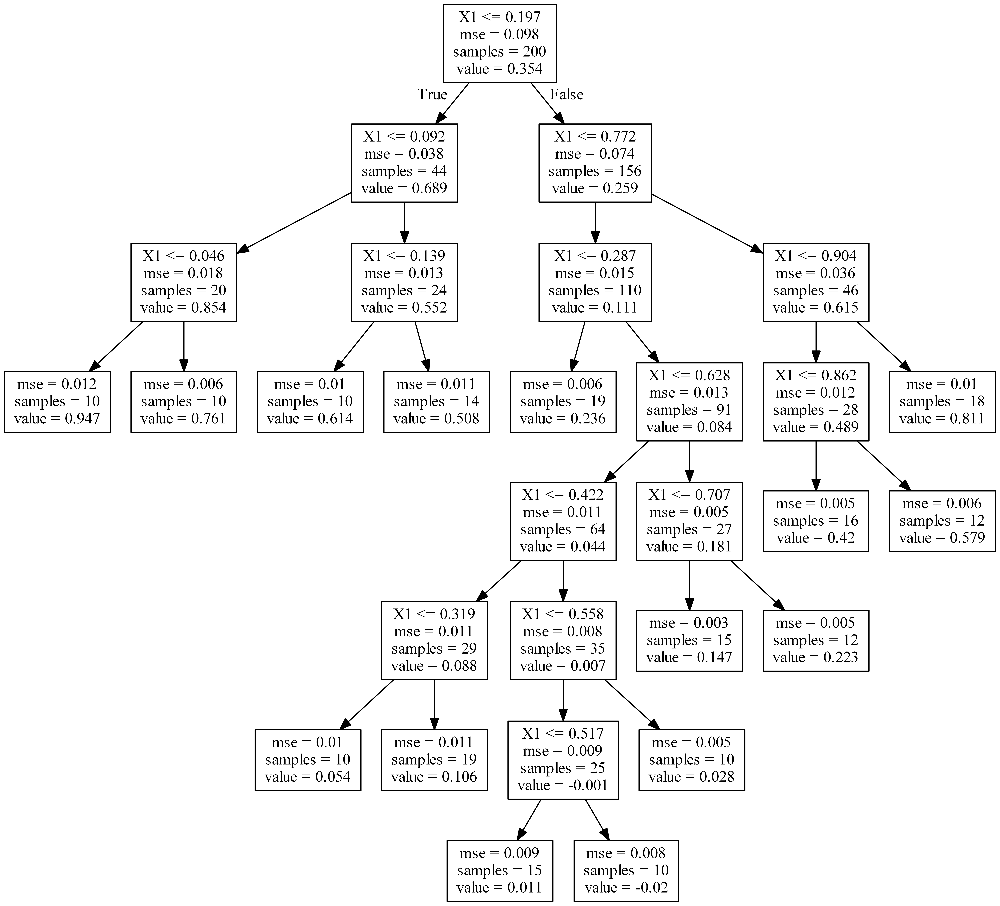

In [39]:
dot_data = tree.export_graphviz(tree_reg2, out_file='tree.dot', 
                                feature_names=["X1"],  
                                class_names=["Y0"])
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename = 'tree.png')

# Exercise solutions

## 1. to 6.

See appendix A.

## 7.

_Exercise: train and fine-tune a Decision Tree for the moons dataset._

a. Generate a moons dataset using `make_moons(n_samples=10000, noise=0.4)`.

Adding `random_state=42` to make this notebook's output constant:

In [56]:
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=10000, noise=0.4, random_state=42)

b. Split it into a training set and a test set using `train_test_split()`.

In [57]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

c. Use grid search with cross-validation (with the help of the `GridSearchCV` class) to find good hyperparameter values for a `DecisionTreeClassifier`. Hint: try various values for `max_leaf_nodes`.

In [58]:
from sklearn.model_selection import GridSearchCV

params = {'max_leaf_nodes': list(range(2, 100)), 'min_samples_split': [2, 3, 4]}
grid_search_cv = GridSearchCV(DecisionTreeClassifier(random_state=42), params, n_jobs=-1, verbose=1)

grid_search_cv.fit(X_train, y_train)

Fitting 3 folds for each of 294 candidates, totalling 882 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 882 out of 882 | elapsed:    9.0s finished


GridSearchCV(cv=None, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=42,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_leaf_nodes': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99], 'min_samples_split': [2, 3, 4]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None

In [59]:
grid_search_cv.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=17,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=42,
            splitter='best')

d. Train it on the full training set using these hyperparameters, and measure your model's performance on the test set. You should get roughly 85% to 87% accuracy.

By default, `GridSearchCV` trains the best model found on the whole training set (you can change this by setting `refit=False`), so we don't need to do it again. We can simply evaluate the model's accuracy:

In [60]:
from sklearn.metrics import accuracy_score

y_pred = grid_search_cv.predict(X_test)
accuracy_score(y_test, y_pred)

0.8695

## 8.

_Exercise: Grow a forest._

a. Continuing the previous exercise, generate 1,000 subsets of the training set, each containing 100 instances selected randomly. Hint: you can use Scikit-Learn's `ShuffleSplit` class for this.

In [61]:
from sklearn.model_selection import ShuffleSplit

n_trees = 1000
n_instances = 100

mini_sets = []

rs = ShuffleSplit(n_splits=n_trees, test_size=len(X_train) - n_instances, random_state=42)
for mini_train_index, mini_test_index in rs.split(X_train):
    X_mini_train = X_train[mini_train_index]
    y_mini_train = y_train[mini_train_index]
    mini_sets.append((X_mini_train, y_mini_train))

b. Train one Decision Tree on each subset, using the best hyperparameter values found above. Evaluate these 1,000 Decision Trees on the test set. Since they were trained on smaller sets, these Decision Trees will likely perform worse than the first Decision Tree, achieving only about 80% accuracy.

In [62]:
from sklearn.base import clone

forest = [clone(grid_search_cv.best_estimator_) for _ in range(n_trees)]

accuracy_scores = []

for tree, (X_mini_train, y_mini_train) in zip(forest, mini_sets):
    tree.fit(X_mini_train, y_mini_train)
    
    y_pred = tree.predict(X_test)
    accuracy_scores.append(accuracy_score(y_test, y_pred))

np.mean(accuracy_scores)

0.8054494999999999

c. Now comes the magic. For each test set instance, generate the predictions of the 1,000 Decision Trees, and keep only the most frequent prediction (you can use SciPy's `mode()` function for this). This gives you _majority-vote predictions_ over the test set.

In [63]:
Y_pred = np.empty([n_trees, len(X_test)], dtype=np.uint8)

for tree_index, tree in enumerate(forest):
    Y_pred[tree_index] = tree.predict(X_test)

In [64]:
from scipy.stats import mode

y_pred_majority_votes, n_votes = mode(Y_pred, axis=0)

d. Evaluate these predictions on the test set: you should obtain a slightly higher accuracy than your first model (about 0.5 to 1.5% higher). Congratulations, you have trained a Random Forest classifier!

In [65]:
accuracy_score(y_test, y_pred_majority_votes.reshape([-1]))

0.872